<a href="https://colab.research.google.com/github/petrusthelastking/UTS_PCVK/blob/main/KEL8_CM_PCVK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Case Method

**Kelompok Timun.**

Anggota Kelompok:
1.  Aditya Atadewa // 2341720174
2.  Petrus Tyang Agung Rosario // 2341720227
3.  Sirfaratih // 2341720072

In [ ]:
#PREPARATION
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

folder_path = '/content/drive/MyDrive/SEMESTER 5/PCVK/Case method'
images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]

print("File gambar:", images)


File gambar: ['/content/drive/MyDrive/SEMESTER 5/PCVK/Case method/IMG_20251013_165458.jpg', '/content/drive/MyDrive/SEMESTER 5/PCVK/Case method/IMG_20251013_165426.jpg', '/content/drive/MyDrive/SEMESTER 5/PCVK/Case method/IMG_20251013_165408.jpg']


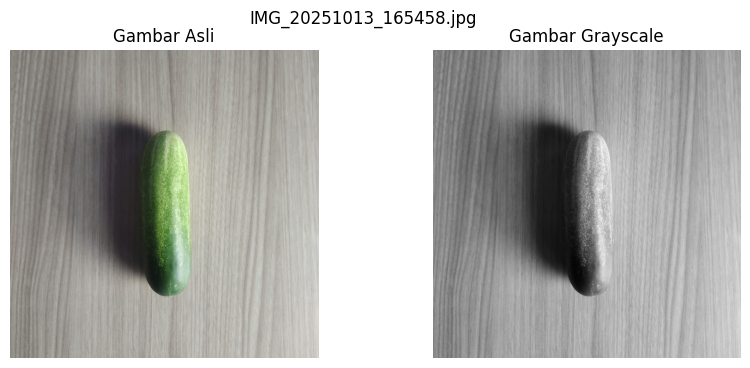

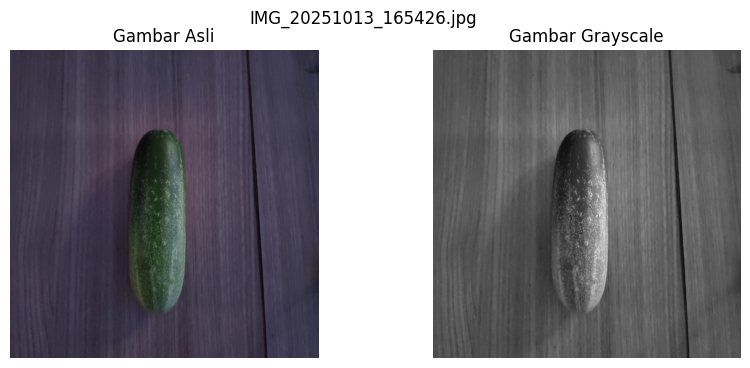

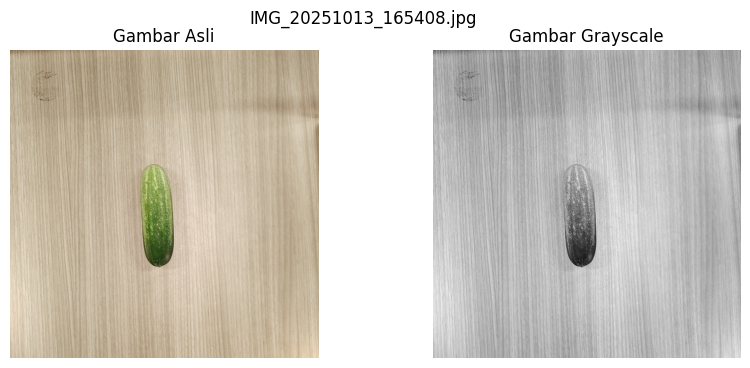

In [ ]:
for img_path in images:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    plt.figure(figsize=(10, 4))

    # Gambar asli (RGB)
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Gambar Asli")
    plt.axis('off')

    # Gambar grayscale
    plt.subplot(1, 2, 2)
    plt.imshow(gray, cmap='gray')  # Gunakan cmap='gray' agar tampil abu-abu
    plt.title("Gambar Grayscale")
    plt.axis('off')

    plt.suptitle(os.path.basename(img_path))
    plt.show()

## Observasi dan Eksperimen

1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya


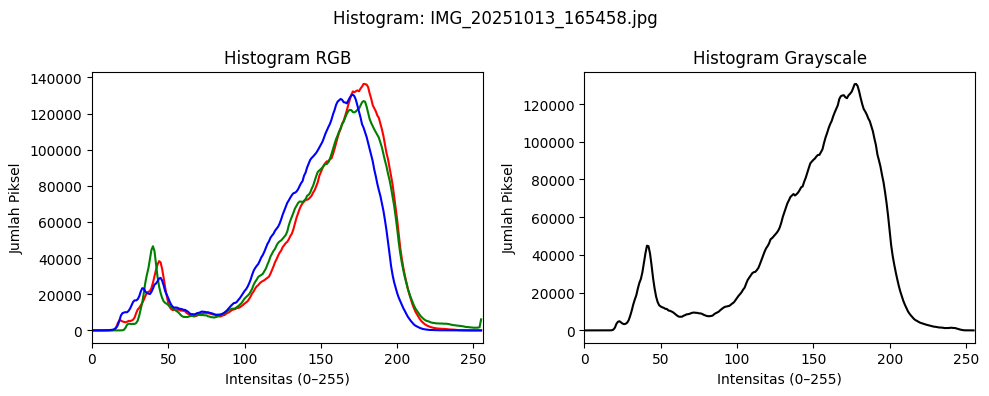

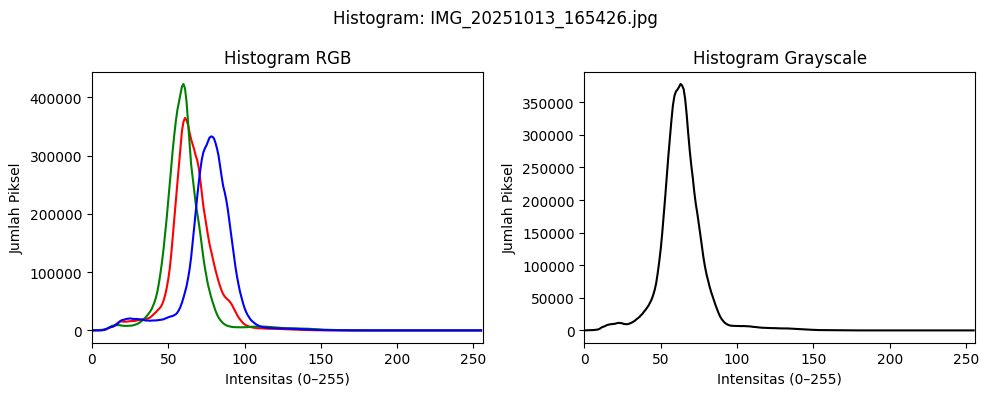

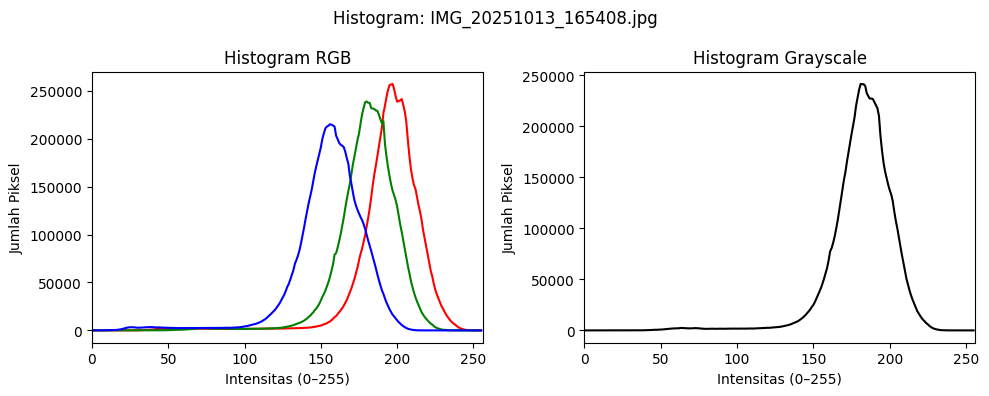

In [ ]:
for img_path in images:
    img = cv2.imread(img_path)
    if img is None:
        print(f"Gagal membaca: {img_path}")
        continue

    # Konversi warna
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    plt.figure(figsize=(10, 4))

    # --- Histogram RGB ---
    plt.subplot(1, 2, 1)
    colors = ('r', 'g', 'b')
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title("Histogram RGB")
    plt.xlabel("Intensitas (0–255)")
    plt.ylabel("Jumlah Piksel")
    plt.xlim([0, 256])

    # --- Histogram Grayscale ---
    plt.subplot(1, 2, 2)
    hist_gray = cv2.calcHist([gray], [0], None, [256], [0, 256])
    plt.plot(hist_gray, color='black')
    plt.title("Histogram Grayscale")
    plt.xlabel("Intensitas (0–255)")
    plt.ylabel("Jumlah Piksel")
    plt.xlim([0, 256])

    plt.suptitle(f"Histogram: {os.path.basename(img_path)}")
    plt.tight_layout()
    plt.show()

##  Terapkan transformasi brightness dan contrast (linear/log brightness).
o Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar data
tampak natural seperti data asli.


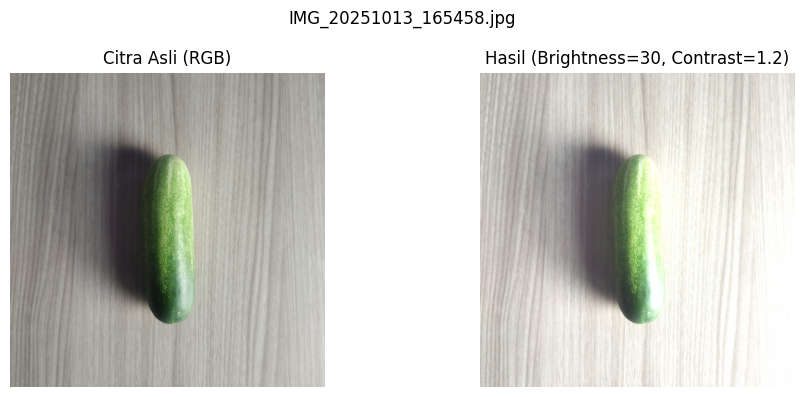

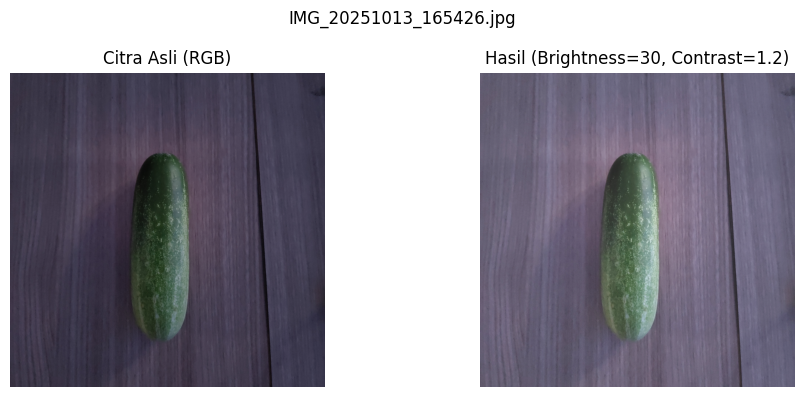

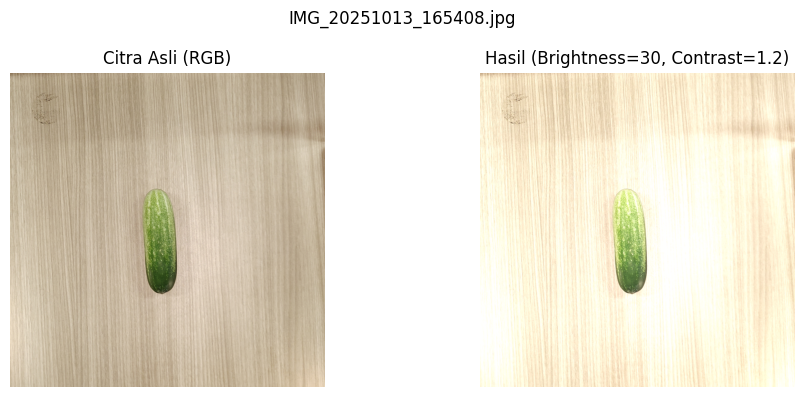

In [ ]:

# Nilai brightness & contrast
b, a = 30, 1.2  # b = brightness, a = contrast

for img_path in images:
    # Baca gambar dalam BGR
    img = cv2.imread(img_path)

    # Konversi ke RGB (biar warnanya benar di matplotlib)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Terapkan transformasi brightness & contrast
    img_bc = cv2.convertScaleAbs(img_rgb, alpha=a, beta=b)

    # Tampilkan hasil
    plt.figure(figsize=(10, 4))

    # Gambar asli
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Citra Asli (RGB)")
    plt.axis('off')

    # Gambar hasil brightness & contrast
    plt.subplot(1, 2, 2)
    plt.imshow(img_bc)
    plt.title(f"Hasil (Brightness={b}, Contrast={a})")
    plt.axis('off')

    plt.suptitle(os.path.basename(img_path))
    plt.tight_layout()
    plt.show()

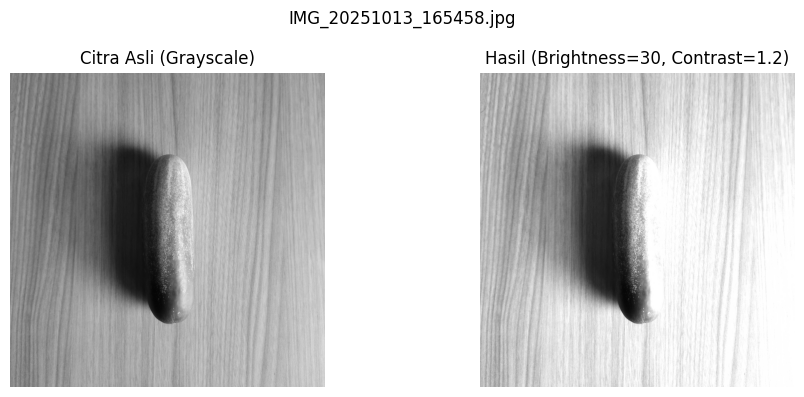

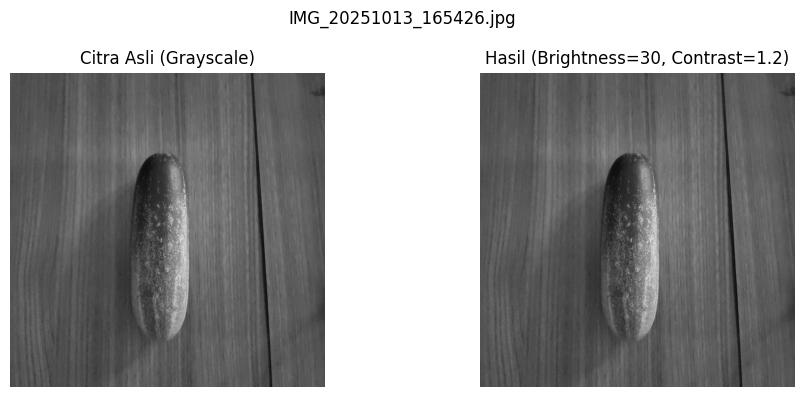

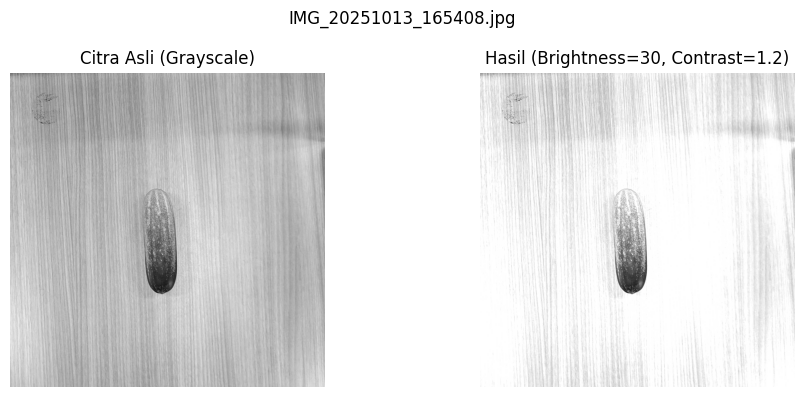

In [ ]:
# Nilai brightness & contrast
b, a = 30, 1.2  # b = brightness, a = contrast

for img_path in images:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Terapkan transformasi linear brightness & contrast
    img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)

    # Tampilkan gambar asli dan hasil
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(gray, cmap='gray')
    plt.title("Citra Asli (Grayscale)")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_bc, cmap='gray')
    plt.title(f"Hasil (Brightness={b}, Contrast={a})")
    plt.axis('off')

    plt.suptitle(os.path.basename(img_path))
    plt.tight_layout()
    plt.show()


# Bagian A(3-5)

In [ ]:
# @title Import & util
import os, cv2, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# Ambil list gambar dari sel temanmu; fallback kalau belum ada
try:
    IMAGES = images
except NameError:
    folder_path = "/content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize"
    IMAGES = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(".jpg")]

assert len(IMAGES) > 0, "Tidak ada file .jpg. Pastikan Drive dimount & path benar."

def imread_gray(p: str) -> np.ndarray:
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is None: raise FileNotFoundError(p)
    return img

def tile_row(images):
    """Gabung citra grayscale berbagai lebar menjadi 1 baris (tinggi disamakan)."""
    h = min(im.shape[0] for im in images)
    resized = [cv2.resize(im, (int(im.shape[1]*h/im.shape[0]), h)) for im in images]
    w = sum(im.shape[1] for im in resized)
    canvas = np.zeros((h, w), dtype=resized[0].dtype)
    x = 0
    for im in resized:
        canvas[:, x:x+im.shape[1]] = im
        x += im.shape[1]
    return canvas

def stats(gray: np.ndarray):
    """Ringkasan kecil: mean (brightness), std (kontras), var(Laplacian) (ketajaman tepi)."""
    mean = float(gray.mean()); std = float(gray.std())
    lap  = cv2.Laplacian(gray, cv2.CV_64F)
    sharp = float(lap.var())
    return dict(mean=round(mean,2), std=round(std,2), lap_var=round(sharp,2))


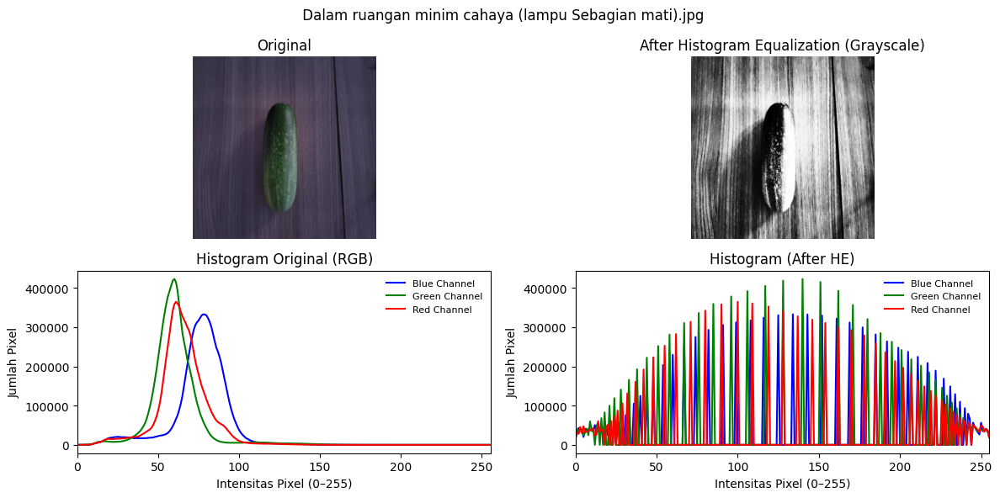

 Dalam ruangan minim cahaya (lampu Sebagian mati).jpg
  Before: {'mean': 63.54, 'std': 14.56, 'lap_var': 31.96}
  After : {'mean': 130.82, 'std': 73.42, 'lap_var': 1499.22}
------------------------------------------------------------


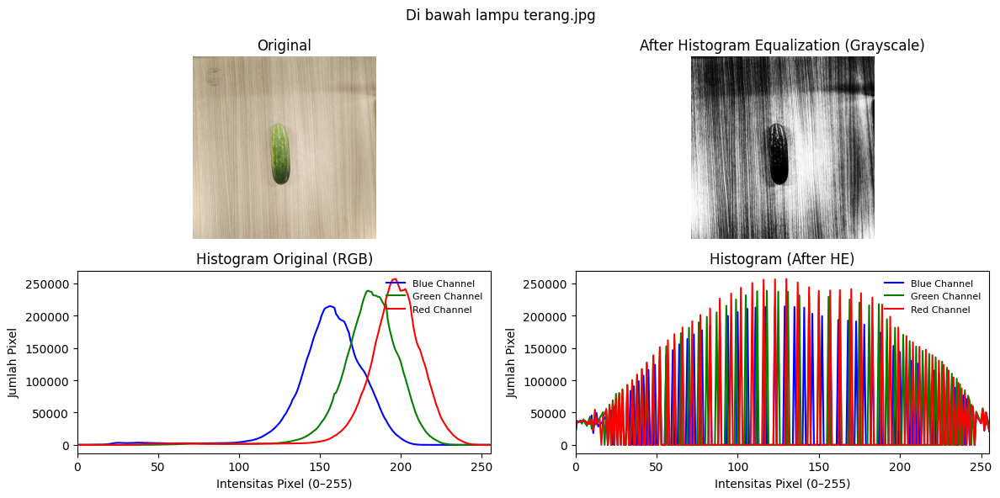

Di bawah lampu terang.jpg
  Before: {'mean': 182.03, 'std': 20.11, 'lap_var': 12.88}
  After : {'mean': 129.74, 'std': 73.73, 'lap_var': 268.22}
------------------------------------------------------------


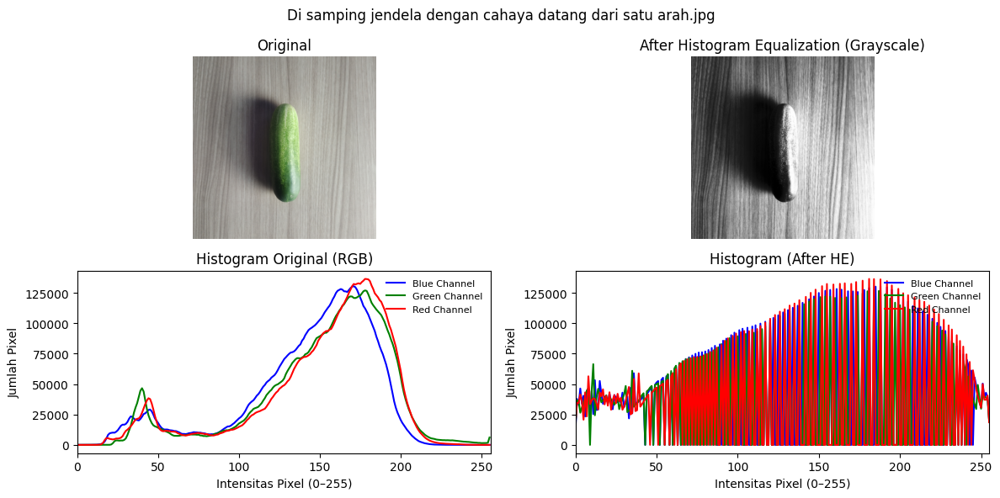

Di samping jendela dengan cahaya datang dari satu arah.jpg
  Before: {'mean': 150.68, 'std': 42.01, 'lap_var': 87.25}
  After : {'mean': 128.63, 'std': 73.94, 'lap_var': 519.55}
------------------------------------------------------------


In [ ]:
# @title Jalankan HE dan tampilkan sebelum–sesudah
from pathlib import Path

# Define output directory
OUTDIR = Path(IMAGES[0]).parent / "outputs_he"
OUTDIR.mkdir(parents=True, exist_ok=True)

for p in IMAGES:
    img = cv2.imread(p) # Read the image in color
    if img is None:
        print(f"Gambar tidak ditemukan: {p}")
        continue

    g  = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Convert to grayscale for HE
    he = cv2.equalizeHist(g)

    # --- Visual & Histogram dalam satu kanvas ---
    fig = plt.figure(figsize=(12,6))
    fig.suptitle(Path(p).name, fontsize=12)

    # Baris 1: Visual
    ax1 = plt.subplot(2,2,1); ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); ax1.set_title("Original"); ax1.axis("off") # Display original color image
    ax2 = plt.subplot(2,2,2); ax2.imshow(he, cmap="gray", vmin=0, vmax=255); ax2.set_title("After Histogram Equalization (Grayscale)"); ax2.axis("off") # Display HE grayscale image

    # Baris 2: Histogram (Original RGB and HE Grayscale)
    ax3 = plt.subplot(2,2,3)
    colors = ('b', 'g', 'r') # OpenCV default color order
    labels = ('Blue Channel', 'Green Channel', 'Red Channel')
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        ax3.plot(hist, color=col, label=labels[i])
    ax3.set_title("Histogram Original (RGB)"); ax3.set_xlim(0,256)
    ax3.set_xlabel('Intensitas Pixel (0–255)')
    ax3.set_ylabel('Jumlah Pixel')
    ax3.legend(loc='upper right', fontsize=8, frameon=False)


    ax4 = plt.subplot(2,2,4)
    # Apply HE to each color channel individually for the histogram
    img_he_color = cv2.merge([cv2.equalizeHist(img[:,:,0]), cv2.equalizeHist(img[:,:,1]), cv2.equalizeHist(img[:,:,2])])
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img_he_color], [i], None, [256], [0, 256])
        ax4.plot(hist, color=col, label=labels[i])
    ax4.set_title("Histogram (After HE)"); ax4.set_xlim(0,255)
    ax4.set_xlabel('Intensitas Pixel (0–255)')
    ax4.set_ylabel('Jumlah Pixel')
    ax4.legend(loc='upper right', fontsize=8, frameon=False)


    plt.tight_layout(); plt.show()

    # --- Simpan keluaran & metrik ringkas ---
    out_img = OUTDIR / f"{Path(p).stem}_he_compare.png"
    fig.savefig(out_img, dpi=150, bbox_inches="tight")

    # Calculate stats on grayscale images
    s_before, s_after = stats(g), stats(he)
    print(f"{Path(p).name}")
    print("  Before:", s_before)
    print("  After :", s_after)
    print("-"*60)

/tmp/ipython-input-543498105.py:33: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.subplot(3,3,4); plt.hist(g.ravel(), 256, (0,256)); plt.title("Hist Original (Gray)")
/tmp/ipython-input-543498105.py:34: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.subplot(3,3,5); plt.hist(he.ravel(), 256, (0,256)); plt.title("Hist HE (Gray)")
/tmp/ipython-input-543498105.py:35: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.subplot(3,3,6); plt.hist(ch.ravel(), 256, (0,256)); plt.title("Hist CLAHE (Gray)")


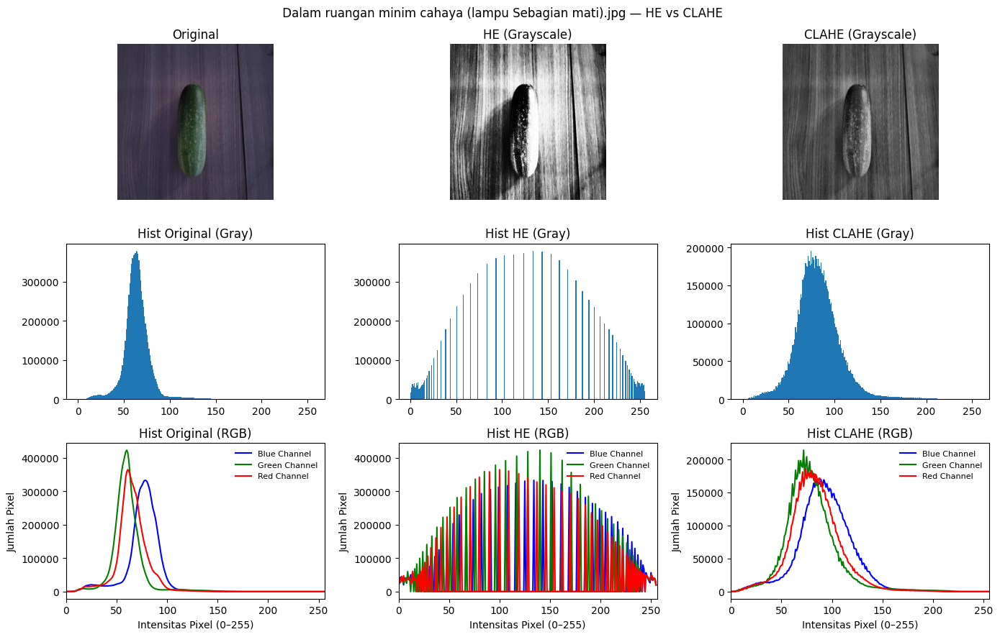

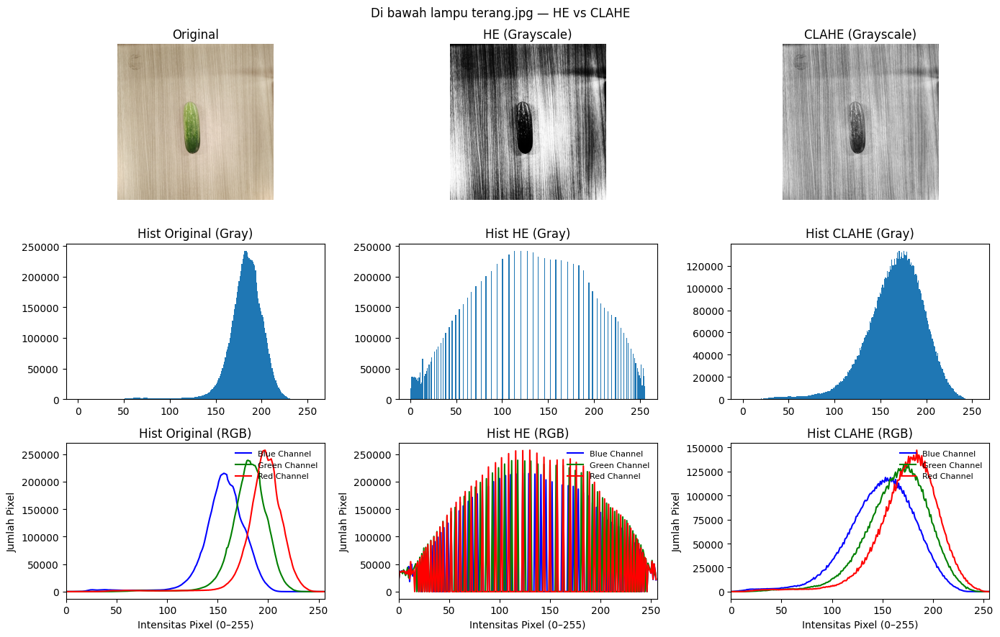

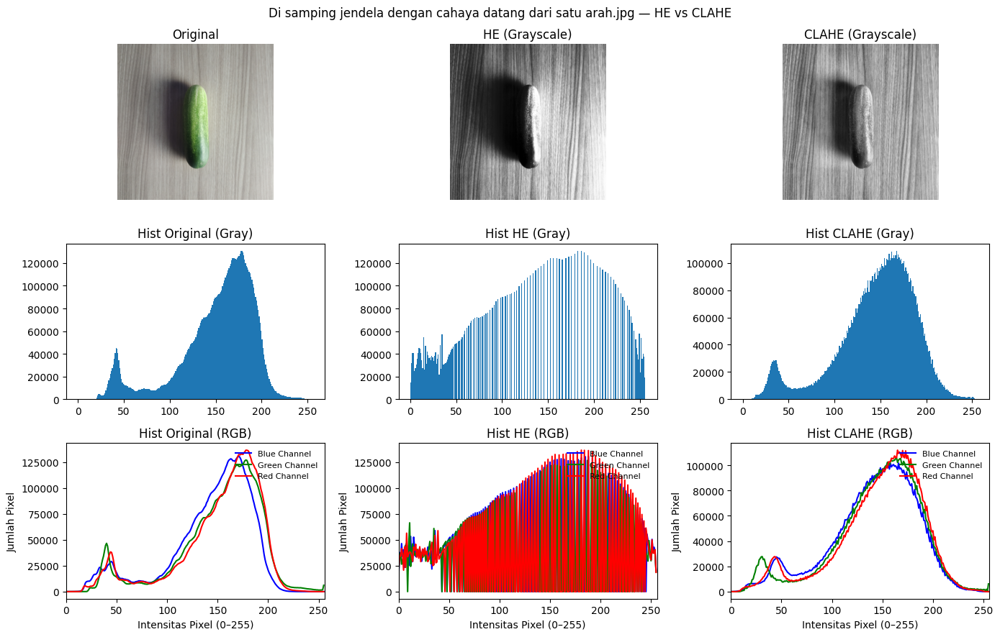

In [ ]:
# @title Jalankan CLAHE (opsional)
from pathlib import Path

# Define output directory
OUTDIR = Path(IMAGES[0]).parent / "outputs_clahe"
OUTDIR.mkdir(parents=True, exist_ok=True)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

colors = ('b', 'g', 'r') # OpenCV default color order
labels = ('Blue Channel', 'Green Channel', 'Red Channel')


for p in IMAGES:
    img = cv2.imread(p) # Read the image in color
    if img is None:
        print(f"Gambar tidak ditemukan: {p}")
        continue

    g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Convert to grayscale for HE and CLAHE
    he = cv2.equalizeHist(g)
    ch = clahe.apply(g)

    fig = plt.figure(figsize=(14,9))
    fig.suptitle(Path(p).name + " — HE vs CLAHE", fontsize=12)

    # Baris 1: Visual
    plt.subplot(3,3,1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.title("Original")
    plt.subplot(3,3,2); plt.imshow(he, cmap="gray", vmin=0, vmax=255); plt.axis("off"); plt.title("HE (Grayscale)")
    plt.subplot(3,3,3); plt.imshow(ch, cmap="gray", vmin=0, vmax=255); plt.axis("off"); plt.title("CLAHE (Grayscale)")

    # Baris 2: Histogram Grayscale
    plt.subplot(3,3,4); plt.hist(g.ravel(), 256, (0,256)); plt.title("Hist Original (Gray)")
    plt.subplot(3,3,5); plt.hist(he.ravel(), 256, (0,256)); plt.title("Hist HE (Gray)")
    plt.subplot(3,3,6); plt.hist(ch.ravel(), 256, (0,256)); plt.title("Hist CLAHE (Gray)")

    # Baris 3: Histogram Color Channels
    ax7 = plt.subplot(3,3,7)
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        ax7.plot(hist, color=col, label=labels[i])
    ax7.set_title("Hist Original (RGB)"); ax7.set_xlim([0,256])
    ax7.set_xlabel('Intensitas Pixel (0–255)')
    ax7.set_ylabel('Jumlah Pixel')
    ax7.legend(loc='upper right', fontsize=8, frameon=False)

    # For HE and CLAHE color histograms, apply HE/CLAHE to each channel individually
    img_he_color = cv2.merge([cv2.equalizeHist(img[:,:,0]), cv2.equalizeHist(img[:,:,1]), cv2.equalizeHist(img[:,:,2])])
    ax8 = plt.subplot(3,3,8)
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img_he_color], [i], None, [256], [0, 256])
        ax8.plot(hist, color=col, label=labels[i])
    ax8.set_title("Hist HE (RGB)"); ax8.set_xlim([0,256])
    ax8.set_xlabel('Intensitas Pixel (0–255)')
    ax8.set_ylabel('Jumlah Pixel')
    ax8.legend(loc='upper right', fontsize=8, frameon=False)

    # For CLAHE color histograms
    img_ch_color = cv2.merge([clahe.apply(img[:,:,0]), clahe.apply(img[:,:,1]), clahe.apply(img[:,:,2])])
    ax9 = plt.subplot(3,3,9)
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img_ch_color], [i], None, [256], [0, 256])
        ax9.plot(hist, color=col, label=labels[i])
    ax9.set_title("Hist CLAHE (RGB)"); ax9.set_xlim([0,256])
    ax9.set_xlabel('Intensitas Pixel (0–255)')
    ax9.set_ylabel('Jumlah Pixel')
    ax9.legend(loc='upper right', fontsize=8, frameon=False)


    plt.tight_layout(); plt.show()

In [ ]:
# @title Fungsi filter spasial
def low_pass_gaussian(gray: np.ndarray, ksize: int = 5) -> np.ndarray:
    """Gaussian blur untuk menghaluskan noise/tekstur berlebih."""
    k = ksize if ksize % 2 == 1 else ksize + 1  # harus ganjil
    return cv2.GaussianBlur(gray, (k, k), 0)

def high_pass_laplacian(gray: np.ndarray, ksize: int = 3, amount: float = 0.7) -> np.ndarray:
    """Penajaman tepi: gray + amount*|Laplacian(gray)|."""
    k = ksize if ksize % 2 == 1 else ksize + 1  # harus ganjil
    lap = cv2.Laplacian(gray, ddepth=cv2.CV_16S, ksize=k)
    lap = cv2.convertScaleAbs(lap)
    sharp = cv2.convertScaleAbs(gray + amount * lap)
    return sharp


In [ ]:
# @title Parameter filter & opsi input
apply_on = "HE"  # @param ["HE", "ORIGINAL"] {allow-input: false}
gaussian_ksize = 5   # @param {type:"slider", min:3, max:15, step:2}
laplacian_ksize = 3  # @param {type:"slider", min:1, max:7, step:2}
sharpen_amount = 0.7 # @param {type:"slider", min:0.2, max:1.5, step:0.1}


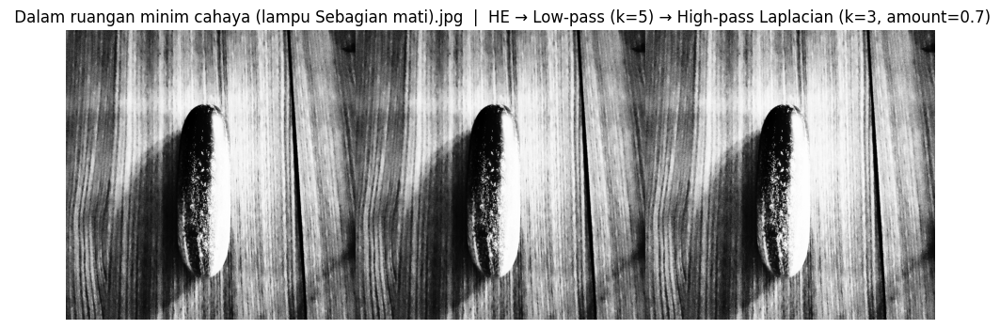

 Dalam ruangan minim cahaya (lampu Sebagian mati).jpg
  HE        : {'mean': 130.82, 'std': 73.42, 'lap_var': 1499.22}
  Low-pass  : {'mean': 130.83, 'std': 71.58, 'lap_var': 75.29}   (halus: noise/tekstur berlebih turun)
  High-pass : {'mean': 145.55, 'std': 72.67, 'lap_var': 1426.23}   (tajam: tepi motif/daun menguat)
----------------------------------------------------------------------


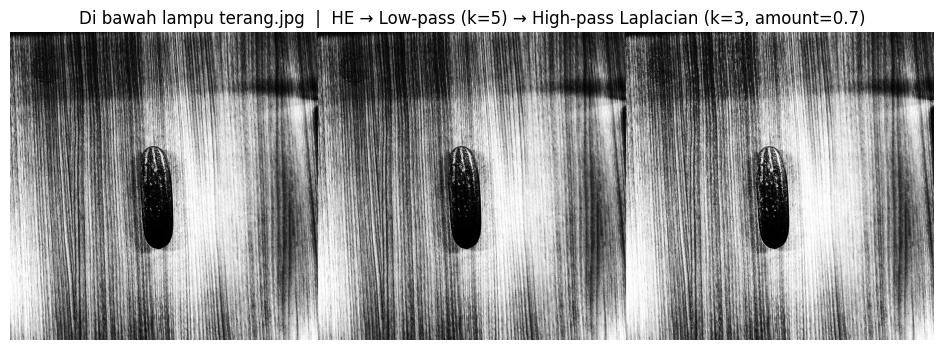

Di bawah lampu terang.jpg
  HE        : {'mean': 129.74, 'std': 73.73, 'lap_var': 268.22}
  Low-pass  : {'mean': 129.74, 'std': 72.33, 'lap_var': 53.48}   (halus: noise/tekstur berlebih turun)
  High-pass : {'mean': 142.47, 'std': 73.08, 'lap_var': 525.72}   (tajam: tepi motif/daun menguat)
----------------------------------------------------------------------


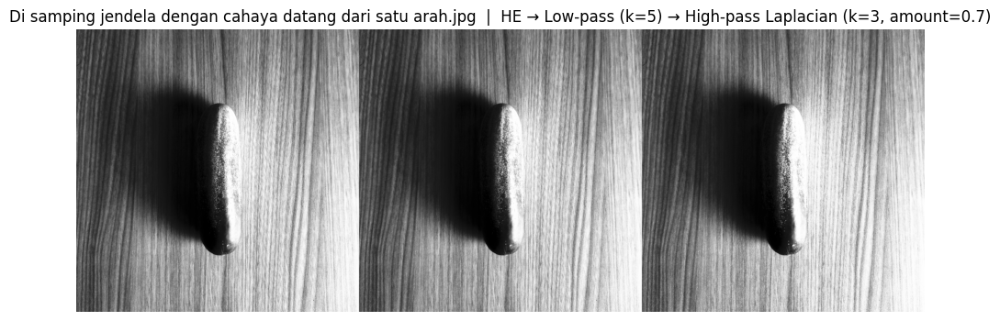

Di samping jendela dengan cahaya datang dari satu arah.jpg
  HE        : {'mean': 128.63, 'std': 73.94, 'lap_var': 519.55}
  Low-pass  : {'mean': 128.63, 'std': 73.17, 'lap_var': 33.79}   (halus: noise/tekstur berlebih turun)
  High-pass : {'mean': 138.15, 'std': 76.7, 'lap_var': 514.7}   (tajam: tepi motif/daun menguat)
----------------------------------------------------------------------


In [ ]:
# @title Run: Low-pass → High-pass dan tampilkan hasil
for p in IMAGES:
    g = imread_gray(p)

    # Base untuk filtering
    if apply_on == "HE":
        base = cv2.equalizeHist(g)
        base_label = "HE"
    else:
        base = g
        base_label = "Original"

    lp = low_pass_gaussian(base, ksize=gaussian_ksize)
    hp = high_pass_laplacian(lp, ksize=laplacian_ksize, amount=sharpen_amount)

    row = tile_row([base, lp, hp])

    plt.figure(figsize=(14,4))
    plt.imshow(row, cmap="gray", vmin=0, vmax=255)
    plt.title(f"{Path(p).name}  |  {base_label} → Low-pass (k={gaussian_ksize}) → High-pass Laplacian (k={laplacian_ksize}, amount={sharpen_amount})")
    plt.axis("off")
    plt.show()

    print(Path(p).name)
    print(f"  {base_label:9s} :", stats(base))
    print(f"  Low-pass  :", stats(lp), "  (halus: noise/tekstur berlebih turun)")
    print(f"  High-pass :", stats(hp), "  (tajam: tepi motif/daun menguat)")
    print("-"*70)


In [ ]:
# @title Import & util
import os, cv2, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# Pakai list 'images' dari sel temanmu jika ada; fallback ke DATA_DIR
try:
    IMAGES = images
except NameError:
    DATA_DIR = Path("/content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize")
    exts = (".jpg", ".jpeg", ".png")
    IMAGES = sorted([str(DATA_DIR/f) for f in os.listdir(DATA_DIR) if f.lower().endswith(exts)])

assert len(IMAGES) > 0, "Tidak ada gambar. Cek mount Drive & path."

OUTDIR = (Path(IMAGES[0]).parent if 'DATA_DIR' in globals() else Path("/content")) / "outputs_dither"
OUTDIR.mkdir(parents=True, exist_ok=True)

def show_rgb(img_bgr, title=""):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,4)); plt.imshow(img_rgb); plt.title(title); plt.axis("off"); plt.show()

def crop_center(img, cw=256, ch=256):
    h, w = img.shape[:2]
    x1 = max(0, (w - cw)//2); y1 = max(0, (h - ch)//2)
    return img[y1:y1+ch, x1:x1+cw]


In [ ]:
# @title Floyd–Steinberg Dithering (grayscale & RGB)

def _fs_dither_channel(ch: np.ndarray, bits: int) -> np.ndarray:
    """FS dithering pada satu channel float32 [0..255]."""
    ch = ch.astype(np.float32).copy()
    h, w = ch.shape
    levels = 2 ** bits
    step   = 255.0 / (levels - 1)

    for y in range(h - 1):
        for x in range(1, w - 1):
            old = ch[y, x]
            new = round(old / step) * step
            ch[y, x] = new
            err = old - new
            ch[y,   x+1] += err * 7/16
            ch[y+1, x-1] += err * 3/16
            ch[y+1, x  ] += err * 5/16
            ch[y+1, x+1] += err * 1/16

    return np.clip(ch, 0, 255).astype(np.uint8)

def fs_dither_gray(gray: np.ndarray, bits: int = 5) -> np.ndarray:
    """FS dithering pada citra grayscale uint8."""
    return _fs_dither_channel(gray.astype(np.float32), bits)

def fs_dither_color(bgr: np.ndarray, bits: int = 5) -> np.ndarray:
    """FS dithering per-channel pada citra warna BGR uint8."""
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    out = np.empty_like(rgb, dtype=np.uint8)
    for c in range(3):
        out[..., c] = _fs_dither_channel(rgb[..., c], bits)
    return cv2.cvtColor(out, cv2.COLOR_RGB2BGR)

def quantize_gray(gray: np.ndarray, bits: int = 5) -> np.ndarray:
    """Quantize biasa (tanpa dithering) untuk pembanding."""
    levels = 2 ** bits
    step = 255.0 / (levels - 1)
    return np.clip(np.round(gray / step) * step, 0, 255).astype(np.uint8)

def quantize_color(bgr: np.ndarray, bits: int = 5) -> np.ndarray:
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    levels = 2 ** bits
    step = 255.0 / (levels - 1)
    q = np.clip(np.round(rgb / step) * step, 0, 255).astype(np.uint8)
    return cv2.cvtColor(q, cv2.COLOR_RGB2BGR)


 Dalam ruangan minim cahaya (lampu Sebagian mati).jpg


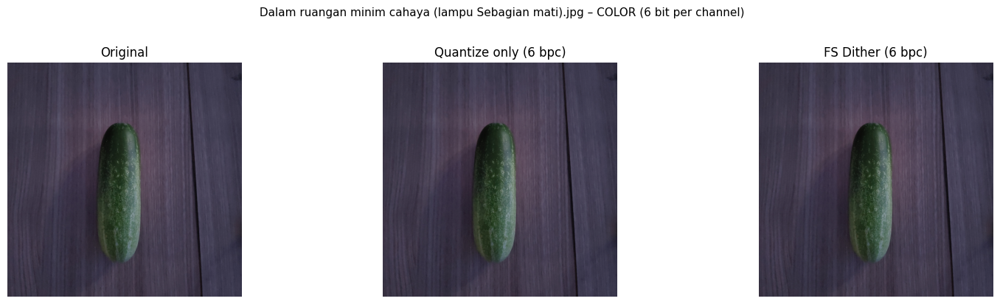

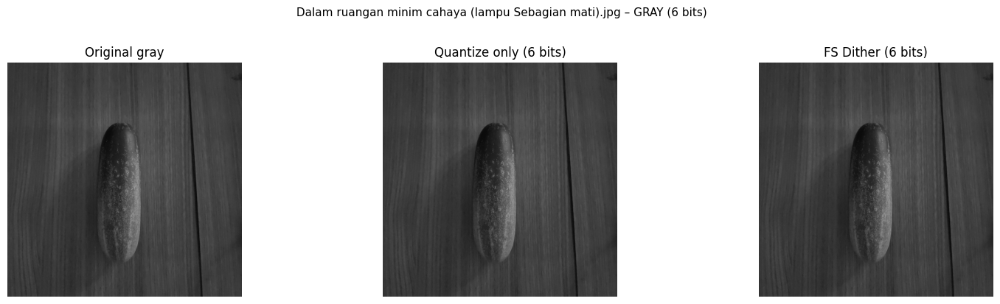

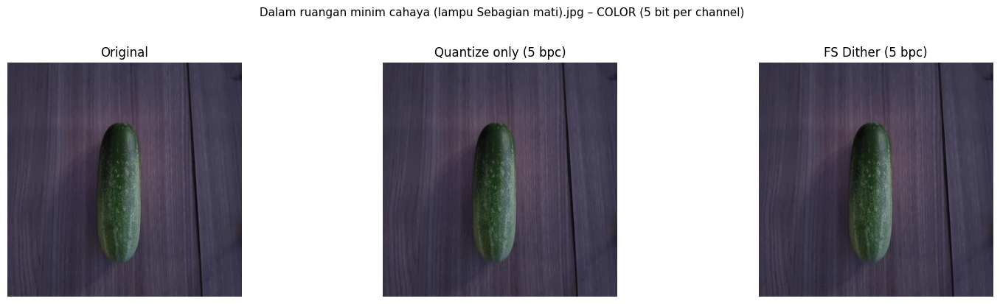

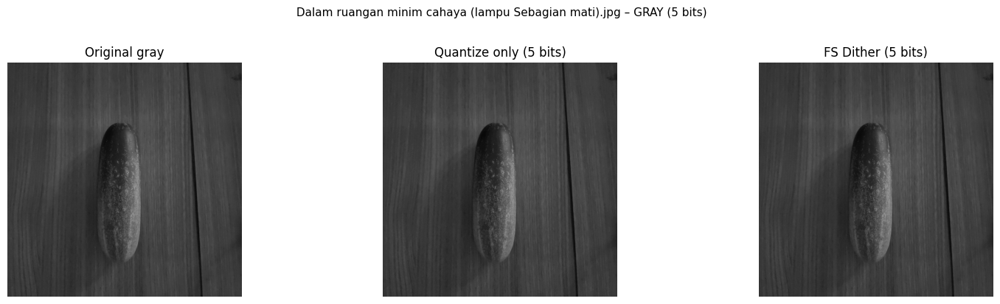

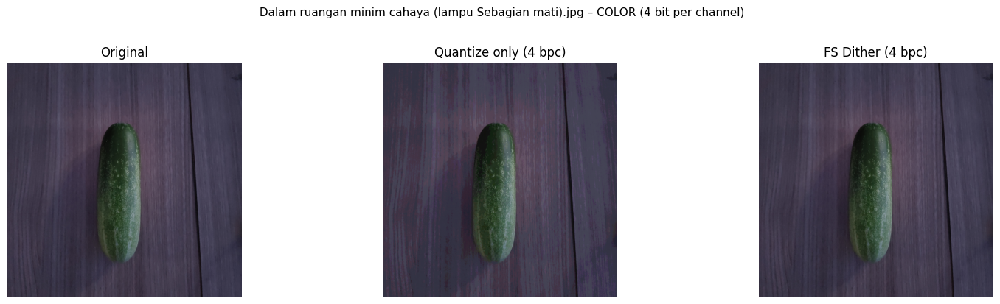

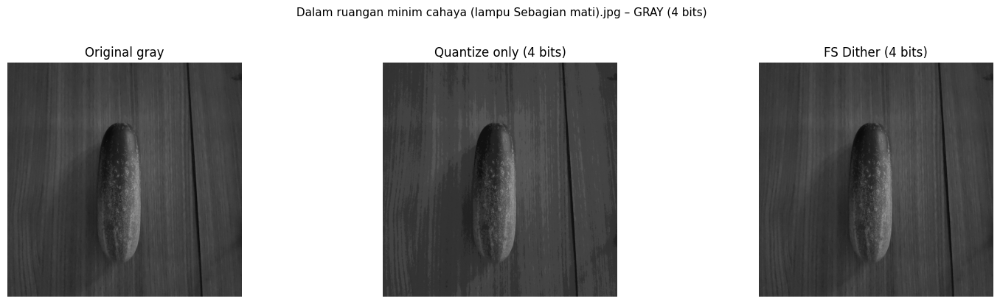

Saved to: /content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize/outputs_clahe
--------------------------------------------------------------------------------
Di bawah lampu terang.jpg


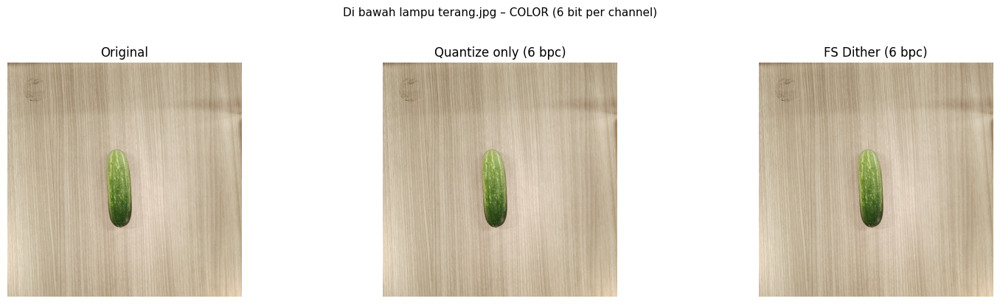

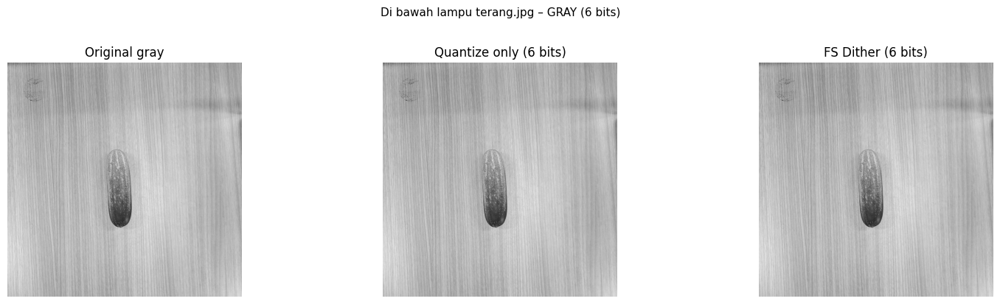

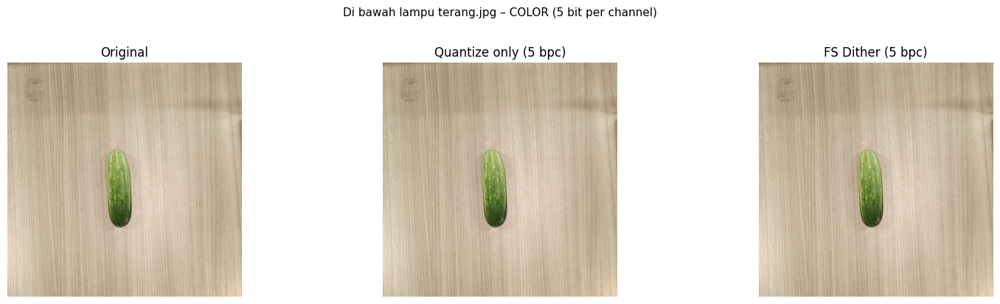

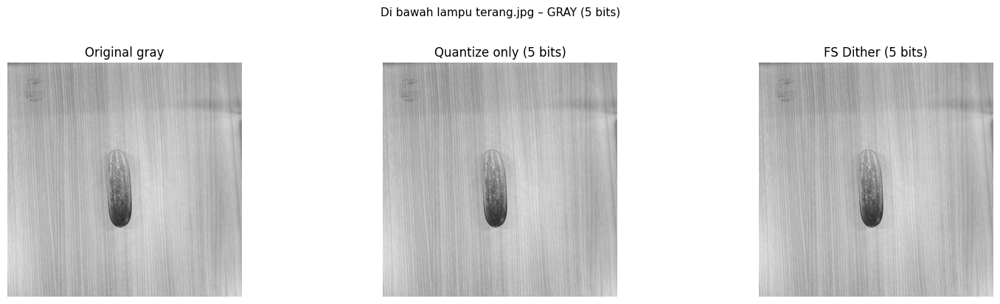

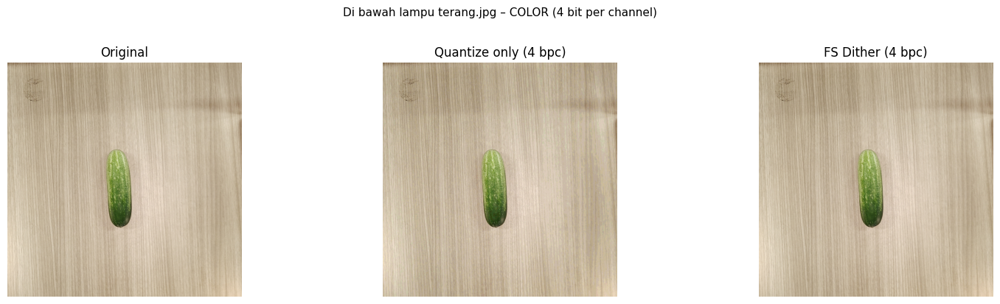

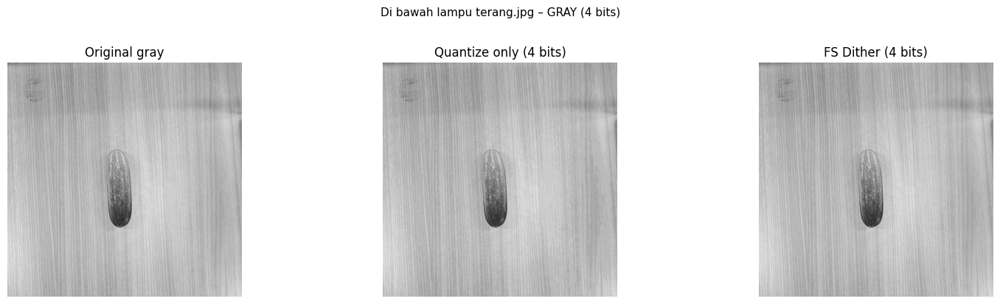

Saved to: /content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize/outputs_clahe
--------------------------------------------------------------------------------
Di samping jendela dengan cahaya datang dari satu arah.jpg


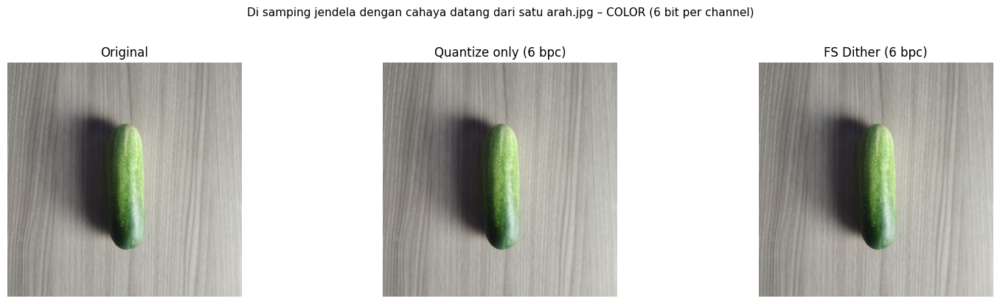

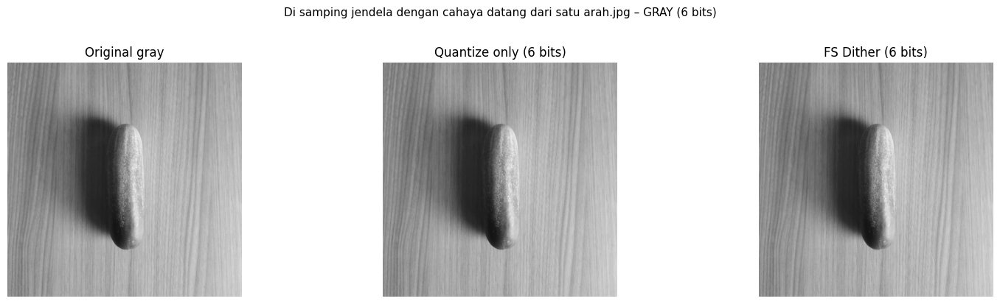

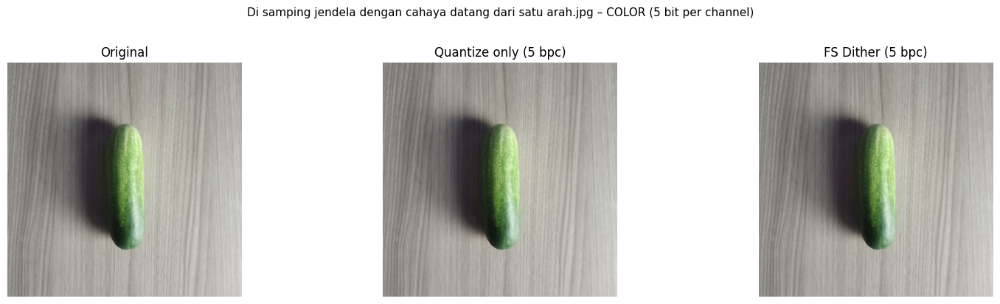

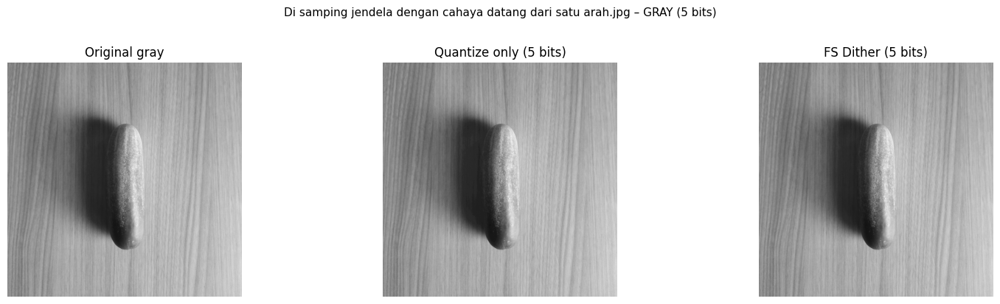

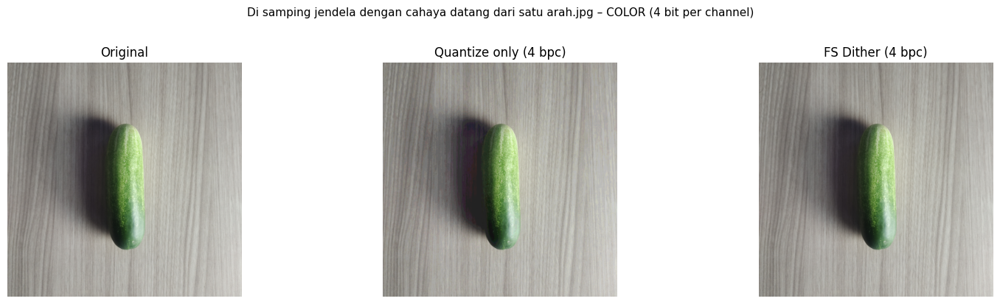

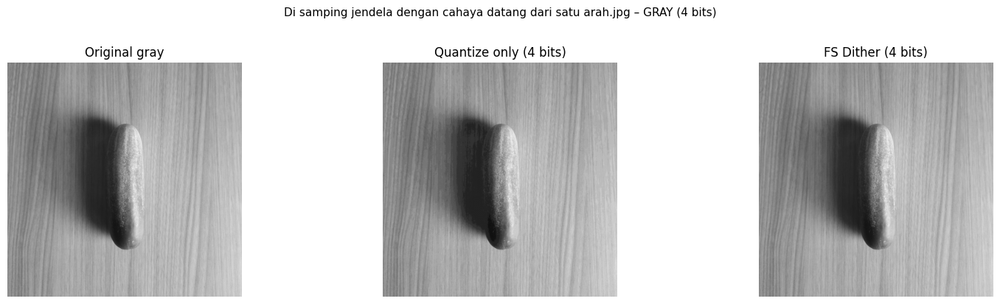

Saved to: /content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize/outputs_clahe
--------------------------------------------------------------------------------


In [ ]:
# @title Run per gambar: color + grayscale, bit-depth 6/5/4
bit_depths = [6, 5, 4]

for p in IMAGES:
    bgr = cv2.imread(p, cv2.IMREAD_COLOR)
    assert bgr is not None, f"Gagal baca {p}"
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

    print(Path(p).name)

    for bits in bit_depths:
        # --- COLOR ---
        q_col  = quantize_color(bgr, bits=bits)
        fs_col = fs_dither_color(bgr, bits=bits)

        # tampilkan
        plt.figure(figsize=(16,4))
        plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)); plt.title("Original"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(cv2.cvtColor(q_col, cv2.COLOR_BGR2RGB)); plt.title(f"Quantize only ({bits} bpc)"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(fs_col, cv2.COLOR_BGR2RGB)); plt.title(f"FS Dither ({bits} bpc)"); plt.axis("off")
        plt.suptitle(f"{Path(p).name} – COLOR ({bits} bit per channel)", y=1.02, fontsize=11)
        plt.tight_layout(); plt.show()

        # simpan
        cv2.imwrite(str(OUTDIR / f"{Path(p).stem}_color_quant_{bits}b.png"), q_col)
        cv2.imwrite(str(OUTDIR / f"{Path(p).stem}_color_fs_{bits}b.png"), fs_col)

        # --- GRAYSCALE (opsional, jika ingin analisis tekstur intensitas saja) ---
        q_g  = quantize_gray(gray, bits=bits)
        fs_g = fs_dither_gray(gray, bits=bits)

        plt.figure(figsize=(16,4))
        plt.subplot(1,3,1); plt.imshow(gray, cmap="gray", vmin=0, vmax=255); plt.title("Original gray"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(q_g, cmap="gray", vmin=0, vmax=255); plt.title(f"Quantize only ({bits} bits)"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(fs_g, cmap="gray", vmin=0, vmax=255); plt.title(f"FS Dither ({bits} bits)"); plt.axis("off")
        plt.suptitle(f"{Path(p).name} – GRAY ({bits} bits)", y=1.02, fontsize=11)
        plt.tight_layout(); plt.show()

        cv2.imwrite(str(OUTDIR / f"{Path(p).stem}_gray_quant_{bits}b.png"), q_g)
        cv2.imwrite(str(OUTDIR / f"{Path(p).stem}_gray_fs_{bits}b.png"),   fs_g)

    print("Saved to:", OUTDIR)
    print("-"*80)


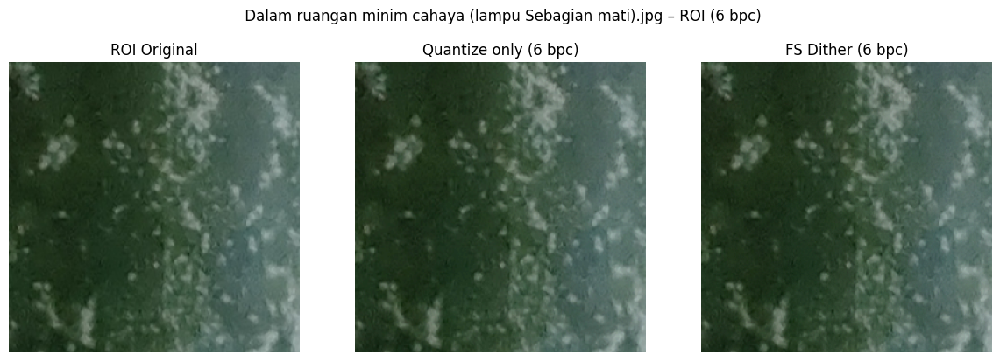

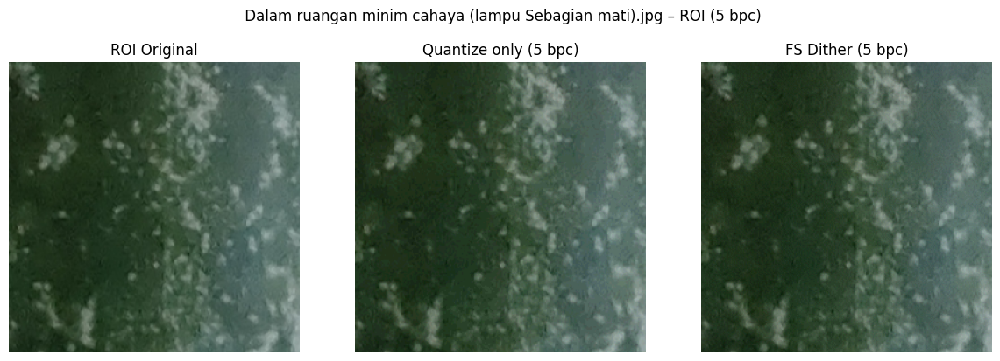

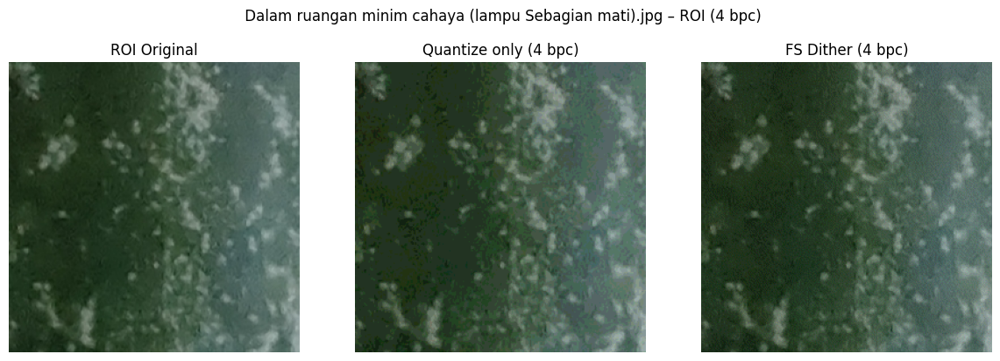

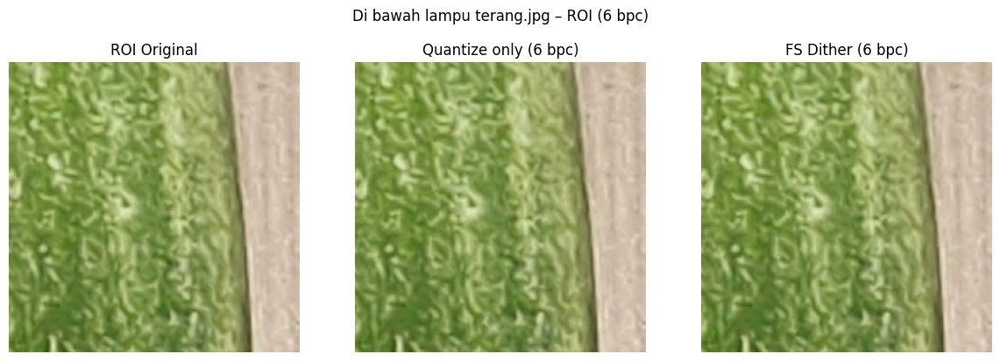

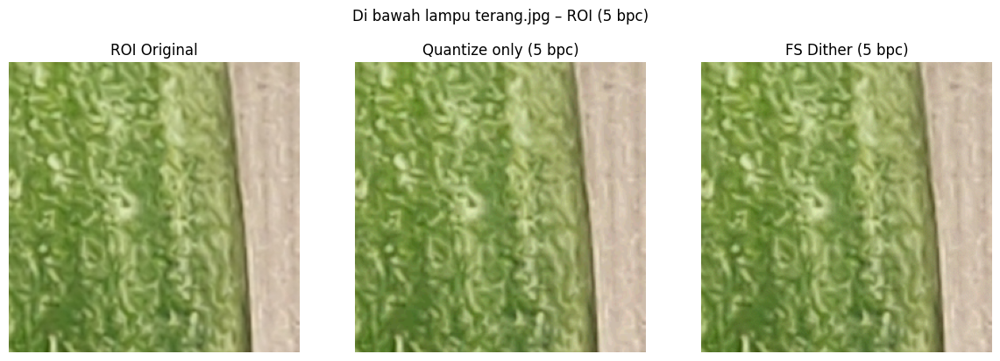

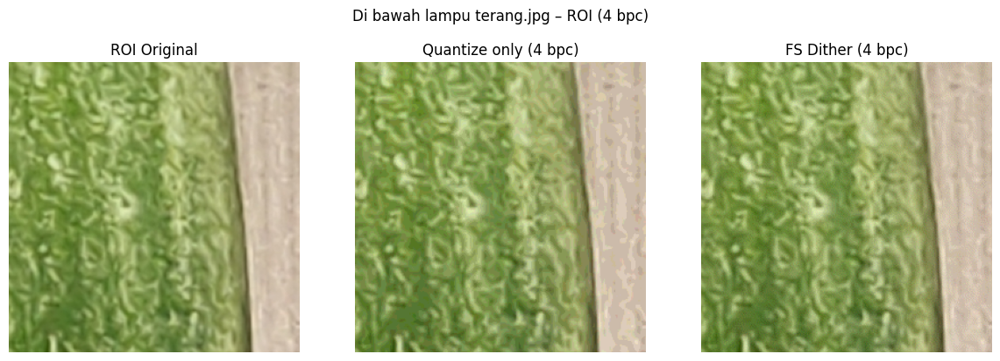

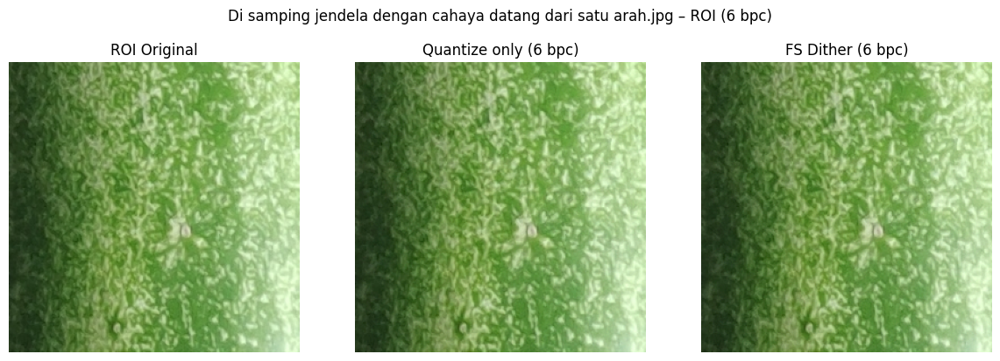

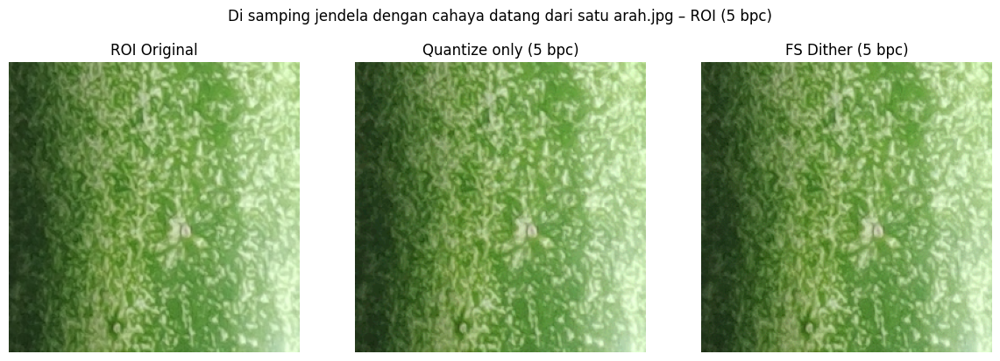

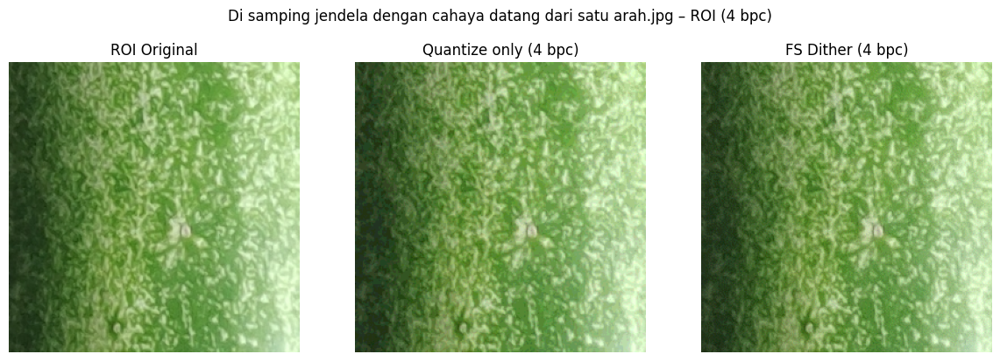

In [ ]:
# @title Zoom perbandingan pada ROI (tengah gambar)
roi_w, roi_h = 256, 256  # @param {type:"slider", min:96, max:384, step:32}

for p in IMAGES:
    bgr = cv2.imread(p, cv2.IMREAD_COLOR)
    roi = crop_center(bgr, roi_w, roi_h)

    for bits in [6,5,4]:
        q_col  = quantize_color(roi, bits)
        fs_col = fs_dither_color(roi, bits)

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)); plt.title("ROI Original"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(cv2.cvtColor(q_col, cv2.COLOR_BGR2RGB)); plt.title(f"Quantize only ({bits} bpc)"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(fs_col, cv2.COLOR_BGR2RGB)); plt.title(f"FS Dither ({bits} bpc)"); plt.axis("off")
        plt.suptitle(f"{Path(p).name} – ROI ({bits} bpc)", y=1.02)
        plt.tight_layout(); plt.show()


In [ ]:
# @title Hitung & tampilkan PSNR

# Pastikan variabel IMAGES tersedia
try:
    IMAGES
except NameError:
    # Ambil list gambar dari sel temanmu; fallback kalau belum ada
    # Sesuaikan folder_path ini jika lokasi gambar berbeda
    folder_path = "/content/drive/MyDrive/PCVK25_3G_19/KEL8_CM_PCVK/IMG resize"
    import os
    IMAGES = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(".jpg")]

assert len(IMAGES) > 0, "Tidak ada file .jpg. Pastikan Drive dimount & path benar."

import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

# @title Fungsi filter spasial (added here for self-containment)
def low_pass_gaussian(gray: np.ndarray, ksize: int = 5) -> np.ndarray:
    """Gaussian blur untuk menghaluskan noise/tekstur berlebih."""
    k = ksize if ksize % 2 == 1 else ksize + 1  # harus ganjil
    return cv2.GaussianBlur(gray, (k, k), 0)

def high_pass_laplacian(gray: np.ndarray, ksize: int = 3, amount: float = 0.7) -> np.ndarray:
    """Penajaman tepi: gray + amount*|Laplacian(gray)|."""
    k = ksize if ksize % 2 == 1 else ksize + 1  # harus ganjil
    lap = cv2.Laplacian(gray, ddepth=cv2.CV_16S, ksize=k)
    lap = cv2.convertScaleAbs(lap)
    sharp = cv2.convertScaleAbs(gray + amount * lap)
    return sharp


def calculate_psnr(img1, img2):
    """Menghitung PSNR antara dua citra (ukuran dan tipe data harus sama)."""
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

# Pilih citra asli dengan pencahayaan baik sebagai referensi
# Anda bisa mengganti indeks [1] dengan indeks citra lain jika diperlukan
reference_image_path = IMAGES[1] # Contoh: Menggunakan citra 'Di bawah lampu terang.jpg'

# Baca citra referensi
img_ref = cv2.imread(reference_image_path, cv2.IMREAD_COLOR)
if img_ref is None:
    print(f"Gambar referensi tidak ditemukan: {reference_image_path}")
else:
    # Konversi ke grayscale jika pra-pemrosesan menggunakan grayscale
    img_ref_gray = cv2.cvtColor(img_ref, cv2.COLOR_BGR2GRAY)

    # Terapkan urutan pra-pemrosesan yang direkomendasikan (HE + High-pass)
    # Ini hanya contoh, sesuaikan dengan urutan terbaik yang Anda simpulkan
    g = cv2.cvtColor(img_ref, cv2.COLOR_BGR2GRAY)
    he = cv2.equalizeHist(g)
    # Gunakan parameter high-pass dari sel sebelumnya (atau parameter lain yang optimal)
    # Asumsi variabel gaussian_ksize dan sharpen_amount ada dari sel sebelumnya, jika tidak, definisikan nilainya
    try:
        lp = low_pass_gaussian(he, ksize=gaussian_ksize)
        img_processed = high_pass_laplacian(lp, ksize=laplacian_ksize, amount=sharpen_amount)
    except NameError:
        print("Variabel filter spasial (gaussian_ksize, laplacian_ksize, sharpen_amount) tidak ditemukan. Menggunakan nilai default.")
        lp = low_pass_gaussian(he, ksize=5)
        img_processed = high_pass_laplacian(lp, ksize=3, amount=0.7)


    # Pastikan kedua citra memiliki ukuran dan tipe data yang sama sebelum menghitung PSNR
    # Jika citra hasil pra-pemrosesan grayscale, bandingkan dengan citra referensi grayscale
    # Jika citra hasil pra-pemrosesan color, pastikan sesuai
    img_ref_for_psnr = img_ref_gray # Bandingkan grayscale
    img_processed_for_psnr = img_processed # Hasil pra-pemrosesan grayscale

    # Pastikan tipe data sama (misal: uint8)
    img_ref_for_psnr = img_ref_for_psnr.astype(np.uint8)
    img_processed_for_psnr = img_processed_for_psnr.astype(np.uint8)


    # Hitung PSNR
    psnr_value = calculate_psnr(img_ref_for_psnr, img_processed_for_psnr)

    print(f"Citra Referensi: {Path(reference_image_path).name}")
    print(f"Citra Hasil Pra-pemrosesan (HE + High-pass)") # Sesuaikan label
    print(f"Nilai PSNR: {psnr_value:.2f} dB")

    # Tampilkan citra referensi dan hasil pra-pemrosesan
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_ref, cv2.COLOR_BGR2RGB)) # Tampilkan referensi warna
    plt.title('Citra Referensi (Original)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_processed, cmap='gray', vmin=0, vmax=255) # Tampilkan hasil pra-pemrosesan grayscale
    plt.title('Hasil Pra-pemrosesan (HE + High-pass)')
    plt.axis('off')

    plt.suptitle(f"Perbandingan PSNR: {Path(reference_image_path).name}", fontsize=12)
    plt.tight_layout()
    plt.show()